In [1]:
import math
import os
import sys

import meep.adjoint as mpa
import numpy as np
from autograd import grad
from autograd import numpy as npa
from autograd import tensor_jacobian_product
from matplotlib import pyplot as plt
from matplotlib.patches import Circle
import seaborn as sns
from scipy import signal, special

import meep as mp
import nlopt  # need install nlopt
plt.style.use("seaborn")

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
np.random.seed(0)

os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
mp.verbosity(0)
cur_path = os.getcwd()


/tmp/ipykernel_570047/1518551773.py:17: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


**init_file**

In [2]:
# init_file
evaluation_histary_files = []
eps_files = []
epses = []
wg_length = 10
wg_eps = 1.96**2 * np.ones(shape=(int(wg_length / 0.02), 12))
for scatter_angle in [0]:
    sub_file = cur_path + "/init_segmented_opt/"
    evaluation_histary_file = sub_file + f"eval_history_seg_init_{scatter_angle}.npy"
    eps_file = sub_file + f"final_eps_seg_init_{scatter_angle}.npy"
    evaluation_histary_files.append(evaluation_histary_file)
    eps = np.load(eps_file)
    epses.append(eps)
    # epses.append(wg_eps)
total_eps = np.concatenate(epses, axis=0)

**segmented_angle_opt**

In [3]:
evaluation_histary_files = []
eps_files = []
epses = []
wg_length = 10
wg_eps = 1.96**2 * np.ones(shape=(int(wg_length / 0.02), 12))
for scatter_angle in [-5, 0]:
    sub_file = cur_path + "/seg_angle_opt" + "/opt_x5_angle5/"
    evaluation_histary_file = sub_file + f"eval_history_seg_angle_{scatter_angle}.npy"
    eps_file = sub_file + f"final_eps_seg_angle_{scatter_angle}.npy"
    evaluation_histary_files.append(evaluation_histary_file)
    eps = np.load(eps_file)
    epses.append(eps)
    # epses.append(wg_eps)
total_eps = np.concatenate(epses, axis=0)

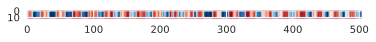

In [4]:
plt.figure(figsize=(6, 1))
plt.imshow(np.rot90(np.abs(total_eps)), cmap="RdBu")

In [219]:
# evaluation_history = np.load(evaluation_histary_file)
# plt.plot(evaluation_history)
# print(evaluation_history[-1])

**Basic Setup**

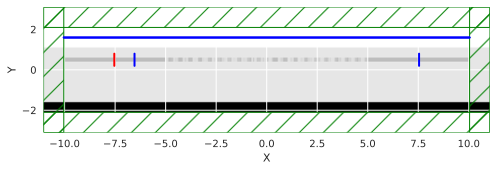

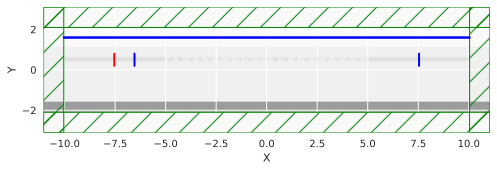

In [5]:
# if True compute flux (Gaussian source), if False compute DFT (Continue source)
compute_flux = True
# size of input and output waveguide
w = 0.5
h = 0.2

# resolution size
grid = 0.02
resolution = 1 / grid

# thickness of PML
dpml = 1

##################### length parameter ################
input_wvg_length = 5
output_wvg_length = 5
# design_region
design_region_x = total_eps.shape[0] * grid
design_region_y = 0.2
sx = input_wvg_length + design_region_x + output_wvg_length + 2 * dpml

##################### height parameter ################
Substrate_thickness = 0.5
BOX_thickness = 2
TOX_thickness = 0.7
near_field_height = 1
sy = BOX_thickness + TOX_thickness + Substrate_thickness + near_field_height + 2 * dpml

cell = mp.Vector3(sx, sy, 0)

# Material setting
Si = mp.Medium(index=3.45)
SiO2 = mp.Medium(index=1.44)
SiN = mp.Medium(index=1.96)

####################### geometry ##########################
Substrate_geo = mp.Block(
    material=Si,
    center=mp.Vector3(y=-0.5 * sy + 0.5 * Substrate_thickness + dpml),
    size=mp.Vector3(sx, Substrate_thickness),
)
BOX_geo = mp.Block(
    material=SiO2,
    center=mp.Vector3(y=-0.5 * sy + Substrate_thickness + 0.5 * BOX_thickness + dpml),
    size=mp.Vector3(sx, BOX_thickness),
)
TOX_geo = mp.Block(
    material=SiO2,
    center=mp.Vector3(
        y=-0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * TOX_thickness + dpml
    ),
    size=mp.Vector3(sx, TOX_thickness),
)
input_waveguide_geo = mp.Block(
    material=SiN,
    center=mp.Vector3(
        -0.5 * sx + 0.5 * input_wvg_length + dpml,
        -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
    ),
    size=mp.Vector3(input_wvg_length, h),
)
output_waveguide_geo = mp.Block(
    material=SiN,
    center=mp.Vector3(
        0.5 * sx - 0.5 * output_wvg_length - dpml,
        -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
    ),
    size=mp.Vector3(output_wvg_length, h),
)

geometry = [
    Substrate_geo,
    BOX_geo,
    TOX_geo,
    input_waveguide_geo,
    output_waveguide_geo,
]

####################### geometry ##########################

# ####################### design region ##########################

design_region_resolution_x = int(resolution)
design_region_resolution_y = 5  # 200nm resolution
Nx = int(design_region_resolution_x * design_region_x)
Ny = int(design_region_resolution_y * design_region_y)
design_variables = mp.MaterialGrid(mp.Vector3(Nx, Ny), SiO2, SiN, grid_type="U_DEFAULT")
design_region = mpa.DesignRegion(
    design_variables,
    volume=mp.Volume(
        center=mp.Vector3(
            -0.5 * sx + input_wvg_length + 0.5 * design_region_x + dpml,
            -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
            0,
        ),
        size=mp.Vector3(design_region_x, design_region_y),
    ),
)
number_para = Nx * Ny
# 初始化granting coupler为最终优化结果
init_para = (np.abs(total_eps[:, 5]) - 1.44**2) / (1.96**2 - 1.44**2)

init_para[init_para > 1] = 1
init_para[init_para < 0] = 0
design_region.update_design_parameters(init_para)
geometry.append(
    mp.Block(
        center=design_region.center,
        size=design_region.size,
        material=design_variables,
    )
)
# ####################### design region ##########################

####################### Sources ##########################
wvl = 0.785
fcen = 1 / wvl
fwidth = 0.2 * fcen
kpoint = mp.Vector3(1, 0, 0)

# waveguide source
sources = [
    mp.EigenModeSource(
        mp.GaussianSource(frequency=fcen, fwidth=fwidth),
        center=input_waveguide_geo.center,
        size=mp.Vector3(0, 3 * h),
        eig_band=1,
        eig_parity=mp.EVEN_Y + mp.ODD_Z,
        eig_match_freq=True,
        direction=mp.NO_DIRECTION,
        eig_kpoint=kpoint,
    )
]
# set nomrlized source: amplitude is 1 -> flux is 1
sources[0].amplitude = 1 / mp.GaussianSource(fcen, fwidth=fwidth).fourier_transform(
    fcen
)

####################### Sources ##########################

sim = mp.Simulation(
    resolution=resolution,
    cell_size=cell,
    boundary_layers=[mp.PML(dpml)],
    sources=sources,
    geometry=geometry,
)

# ############### Monitor ###################
nfreq = 1

near_region = mp.FluxRegion(
    center=mp.Vector3(0, 0.5 * sy - dpml - 0.5 * near_field_height, 0),
    size=mp.Vector3(sx - 2 * dpml, 0),
)

near_field = sim.add_mode_monitor(
    fcen,
    0,
    1,
    near_region,
)

# near2far_field
n2f_field = sim.add_near2far(
    fcen,
    0,
    1,
    near_region,
)

src_region = mp.FluxRegion(
    center=mp.Vector3(
        input_waveguide_geo.center.x + 1, input_waveguide_geo.center.y, 0
    ),
    size=mp.Vector3(0, 3 * h, 0),
)
src_field = sim.add_mode_monitor(
    fcen,
    0,
    1,
    src_region,
)

out_region = mp.FluxRegion(
    center=mp.Vector3(output_waveguide_geo.center.x, output_waveguide_geo.center.y, 0),
    size=mp.Vector3(0, 3 * h, 0),
)
out_field = sim.add_mode_monitor(
    fcen,
    0,
    1,
    out_region,
)

sim.plot2D()

# mpt = mp.Vector3(input_waveguide_geo.center.x - 3, input_waveguide_geo.center.y)
mpt = mp.Vector3(output_waveguide_geo.center.x - 3, input_waveguide_geo.center.y)

f = plt.figure(dpi=100)
Animate = mp.Animate2D(fields=mp.Ez, f=f, realtime=False, normalize=True)

sim.run(
    mp.at_every(1, Animate),
    until_after_sources=mp.stop_when_fields_decayed(50, mp.Ez, mpt, 1e-5),
)
# filename = "base_simulation_GS.mp4"
# Animate.to_mp4(10, filename)

In [ ]:
16624

In [16]:
Animate.to_jshtml(fps=1)

# 远场验证

/tmp/ipykernel_481959/3084273244.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


Text(0, 0.5, '$ |{E_z}|^2 $')

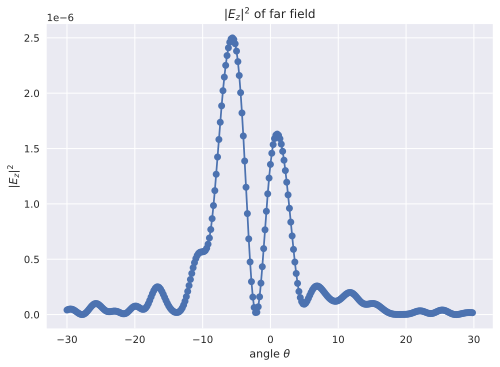

In [17]:
d_angle = 0.2
ff_distance = 1e6
ff_angle = 89
ff_number = int(2 / d_angle * ff_angle) + 1
ff_angles = np.linspace(-ff_angle, ff_angle, ff_number)
ff_points = [
    mp.Vector3(fx, ff_distance, 0) for fx in np.tan(np.radians(ff_angles)) * ff_distance
]

plt.style.use("seaborn")
n2f = []
for point in ff_points:
    ff = sim.get_farfield(n2f_field, point)
    n2f.append(ff)
rel = []  # rel中存储的是far field的强度
for ff in n2f:
    rel.append(np.abs(ff[2]) ** 2)

plot_angle = 30  # 绘制的角度范围
figure, ax = plt.subplots()
angle_minlim = np.where(ff_angles == -plot_angle)[0][0]
angle_maxlim = np.where(ff_angles == plot_angle)[0][0]
plt.plot(ff_angles[angle_minlim:angle_maxlim], rel[angle_minlim:angle_maxlim], "-o")
plt.title(r"$ |{E_z}|^2 $ of far field")
ax.set_xlabel(r"angle $ \theta $")
ax.set_ylabel(r"$ |{E_z}|^2 $")

In [7]:
d_length = []
for angle in ff_angles:
    # The length of each angle in the far field
    length = ff_distance / np.cos(np.radians(angle))
    d_length.append(np.radians(d_angle) * length)

print(f"The total length {np.sum(d_length)} um calculated by angles")

energy = 0
for ii in range(0, ff_number, 1):
    energy = energy + d_length[ii] * (np.abs(rel[ii]))
print(f"The power of near_field is {energy}")

near_field_flux = mp.get_fluxes(near_field)
print(f"The power of near_field is {near_field_flux[0]}")


The total length 9689347.824509013 um calculated by angles
The power of near_field is 0.3762097332205401
The power of near_field is 0.37574476092062126


In [224]:
angle0_index = np.where(ff_angles == 0)[0][0]
print(rel[angle0_index]/np.sum(rel))
print((rel[angle0_index]*d_length[angle0_index])/near_field_flux[0])

0.012296815633525957
0.012046539854864842


**mode and flux of input and output**

In [225]:
input_mode = sim.get_eigenmode_coefficients(
    src_field, [1], eig_parity=mp.EVEN_Y + mp.ODD_Z
)
input_mode_coe = np.squeeze(input_mode.alpha)
input_flux = mp.get_fluxes(src_field)
print(f"根据eigenmode_coe[0]计算得到的flux: {abs(input_mode_coe[0]) ** 2}")
print(f"根据flux计算得到的flux: {input_flux}")
print(f'逆向eigenmode_coe[0]: {abs(input_mode_coe[1]) ** 2}')
print(f"正向eigenmode_coe[0]-逆向eigenmode_coe[1]: {abs(input_mode_coe[0]) ** 2 - abs(input_mode_coe[1]) ** 2}")

根据eigenmode_coe[0]计算得到的flux: 1.0038397726428812
根据flux计算得到的flux: [0.9610493902545887]
逆向eigenmode_coe[0]: 0.04427182132907785
正向eigenmode_coe[0]-逆向eigenmode_coe[1]: 0.9595679513138033


In [226]:
output_mode = sim.get_eigenmode_coefficients(
    out_field, [1], eig_parity=mp.EVEN_Y + mp.ODD_Z
)
output_mode_coe = np.squeeze(output_mode.alpha)
output_flux = mp.get_fluxes(out_field)
print(output_flux)
print(np.abs(output_mode_coe[0]) ** 2)

[0.45981236320543384]
0.46556792183838674


(252, 12)


/tmp/ipykernel_319901/2047625378.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-paper")
/home/chen/miniconda3/envs/mp/lib/python3.11/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


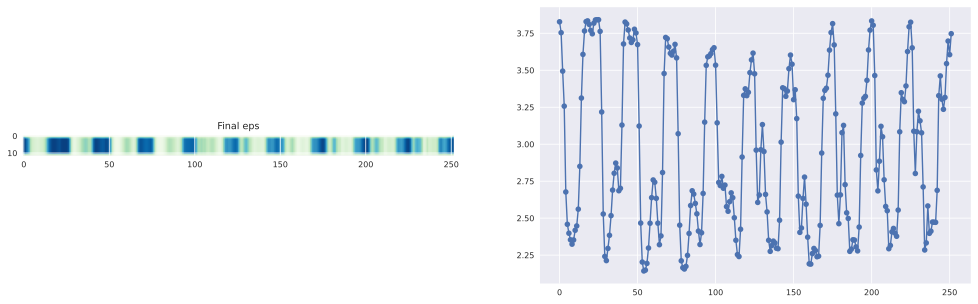

In [227]:
plt.style.use("seaborn-paper")
eps = np.load(eps_file)
print(eps.shape)
f1, ax = plt.subplots(1, 2, figsize=(17, 5))
ax[0].imshow(np.rot90(np.abs(eps)), cmap="GnBu")
ax[0].set_title("Final eps")
ax[1].plot(eps[:, 5], "-o")

**验证目标函数值的计算是否正确**

In [228]:
print(f"优化目标函数最终输出结构：{evaluation_history[-1]}")
# !根据segmented_opt.py中的参数进行修改
w1 = 5 * np.power(10, 4)
# angle_0index = np.where(ff_angles == scatter_angle)[0][0]
ff_distance = 1e6
fx = np.tan(np.radians(scatter_angle)) * ff_distance
ob1 = np.abs(sim.get_farfield(n2f_field, mp.Vector3(fx, ff_distance, 0))[2]) ** 2 * w1
# !根据segmented_opt.py中的参数进行修改
idea_output = 0.7333334
out = abs(output_mode_coe[0]) ** 2
w2 = 1
ob2 = -np.abs((np.abs(out) - idea_output) * w2)
ob = ob1 + ob2
print(f"验证目标函数最终输出结构：{ob}")

NameError: name 'evaluation_history' is not defined

In [ ]:
np.abs(sim.get_farfield(n2f_field, mp.Vector3(0, 1e6, 0)))

array([0.00000000e+00, 0.00000000e+00, 8.46144755e-04, 8.46144755e-04,
       5.18070431e-09, 0.00000000e+00])

# 远程验证(opt)

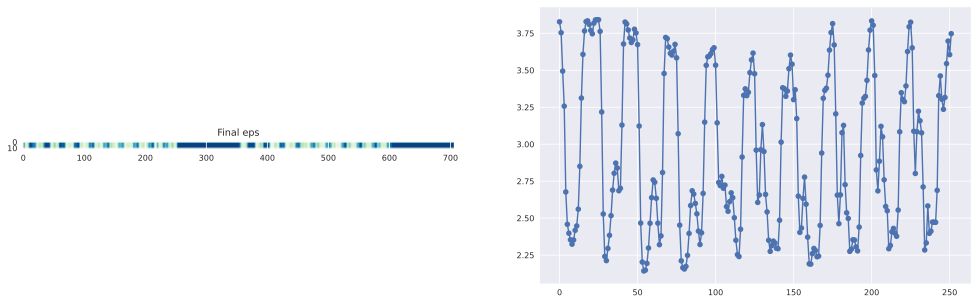

In [ ]:
eps_vf = sim.get_array(
    component=mp.Dielectric,
    frequency=fcen,
    center=mp.Vector3(
        -0.5 * sx + dpml + input_wvg_length + 0.5 * design_region_x,
        -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
        0,
    ),
    size=mp.Vector3(design_region_x, h, 0),
)
f1, ax = plt.subplots(1, 2, figsize=(17, 5))
ax[0].imshow(np.rot90(np.abs(eps_vf)), cmap="GnBu")
ax[0].set_title("Final eps")
ax[1].plot(eps[:, 5], "-o")

In [ ]:
plt.plot(np.abs(eps_vf[:, 6])-np.abs(eps[:, 6]))


ValueError: operands could not be broadcast together with shapes (706,) (252,) 

In [ ]:
eps_vf[:, 5]

In [ ]:
sns.heatmap(np.rot90(np.abs(eps)-np.abs(eps_vf)), cmap="GnBu")

In [ ]:
eps_vf.shape